In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 데이터 불러오기
df=pd.read_csv('/content/drive/MyDrive/프로젝트/project_hotel_reservation/hotel_bookings.csv')

# 기본 정보 파악

In [3]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [5]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


# 중복행 제거

In [6]:
df.drop_duplicates(keep='first', inplace=True)
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


# NULL값 채우기

In [7]:
# null값 확인
null = pd.DataFrame({'Null Values' : df.isna().sum()})
null

,Null Values
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [8]:
# 결측치 채우기
# children, agent 및 company → 0
# country → 최빈값

df['children'].fillna(0, inplace=True)

most_common_country = df['country'].mode()[0]
df['country'].fillna(most_common_country, inplace=True)

df['agent'].fillna(0, inplace=True)
df['company'].fillna(0, inplace=True)

In [9]:
# adults=0 & children=0 & babies=0 인 레이블 → 제거(필터링)
filter = (df.children == 0) & (df.adults == 0) & (df.babies == 0)

df = df[~filter]
df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,0.0,0.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,0.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,0.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,0.0,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,0.0,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,0.0,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,0.0,0,Transient,104.40,0,0,Check-Out,2017-09-07


# 상관관계 히트맵

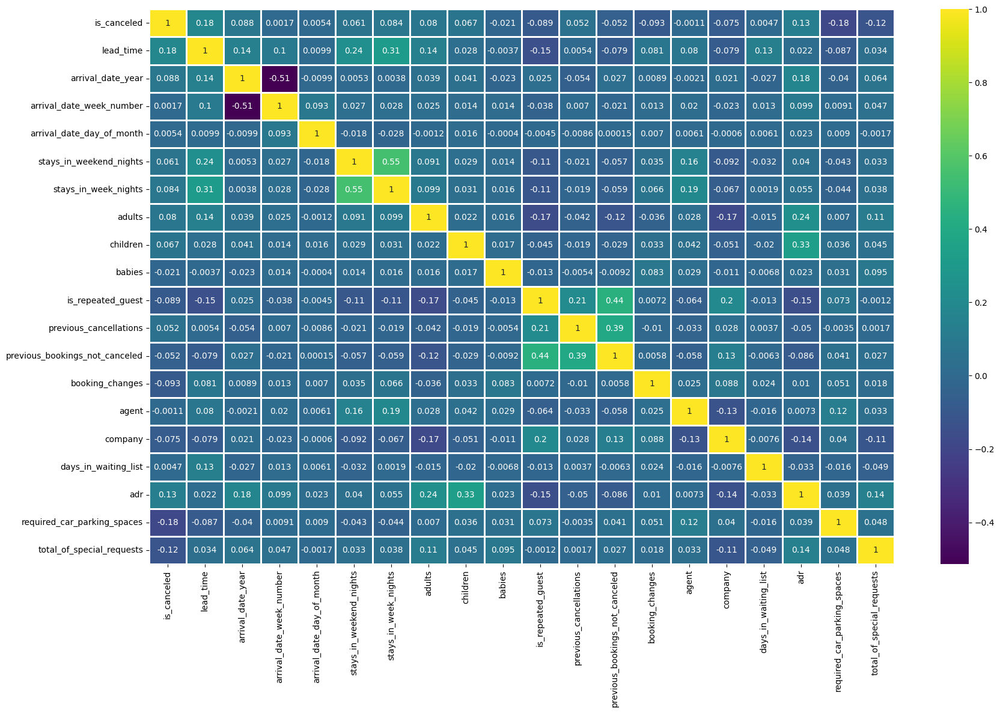

In [10]:
#상관관계 히트맵
plt.figure(figsize = (20, 12))

corr = df.corr()
sns.heatmap(corr, annot = True,linewidths = 1, cmap='viridis')
plt.show()

In [11]:
# is_canceled에 대한 절대값 상관관계 내림차순
correlation = df.corr()['is_canceled'].abs().sort_values(ascending = False)
correlation

is_canceled                       1.000000
lead_time                         0.184515
required_car_parking_spaces       0.184456
adr                               0.127233
total_of_special_requests         0.120794
booking_changes                   0.093236
is_repeated_guest                 0.088764
arrival_date_year                 0.088020
stays_in_week_nights              0.084159
adults                            0.080271
company                           0.075314
children                          0.067182
stays_in_weekend_nights           0.060992
previous_bookings_not_canceled    0.052178
previous_cancellations            0.051501
babies                            0.020627
arrival_date_day_of_month         0.005449
days_in_waiting_list              0.004710
arrival_date_week_number          0.001691
agent                             0.001145
Name: is_canceled, dtype: float64

# 유용하지 않은 열 삭제

In [12]:
# 유용하지 않은 열 삭제
useless_col = ['reservation_status', 'country','assigned_room_type']

df.drop(useless_col, axis = 1, inplace = True)
df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,3,No Deposit,0.0,0.0,0,Transient,0.00,0,0,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,4,No Deposit,0.0,0.0,0,Transient,0.00,0,0,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,No Deposit,0.0,0.0,0,Transient,75.00,0,0,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,No Deposit,304.0,0.0,0,Transient,75.00,0,0,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,No Deposit,240.0,0.0,0,Transient,98.00,0,1,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,0,No Deposit,394.0,0.0,0,Transient,96.14,0,0,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,0,No Deposit,9.0,0.0,0,Transient,225.43,0,2,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,0,No Deposit,9.0,0.0,0,Transient,157.71,0,4,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,0,No Deposit,89.0,0.0,0,Transient,104.40,0,0,2017-09-07


# 범주형 데이터 처리

In [13]:
# 숫자형 및 범주형 데이터프레임 생성: 문자열 찾기

cols = [col for col in df.columns if df[col].dtype == 'O']
cols

['hotel',
 'arrival_date_month',
 'meal',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'deposit_type',
 'customer_type',
 'reservation_status_date']

In [14]:
cols_df = df[cols]
cols_df.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,reservation_status_date
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,2015-07-02
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,2015-07-02
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,2015-07-03


## 날짜 컬럼 분할

In [15]:
# 날짜와 시간 형식으로 변환
cols_df['reservation_status_date'] = pd.to_datetime(cols_df['reservation_status_date'])

cols_df['year'] = cols_df['reservation_status_date'].dt.year
cols_df['month'] = cols_df['reservation_status_date'].dt.month
cols_df['day'] = cols_df['reservation_status_date'].dt.day


cols_df.drop(['reservation_status_date'] , axis = 1, inplace = True)
cols_df.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015,7,1
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015,7,1
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,2015,7,2
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,2015,7,2
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,2015,7,3


## 카테고리 -> 숫자 매치

In [16]:
# 데이터프레임의 각 카테고리컬 열에 대해 고유한 값들을 출력
for col in cols_df.columns:
    print(f"{col}: \n{cols_df[col].unique()}\n")

hotel: 
['Resort Hotel' 'City Hotel']

arrival_date_month: 
['July' 'August' 'September' 'October' 'November' 'December' 'January'
 'February' 'March' 'April' 'May' 'June']

meal: 
['BB' 'FB' 'HB' 'SC' 'Undefined']

market_segment: 
['Direct' 'Corporate' 'Online TA' 'Offline TA/TO' 'Complementary' 'Groups'
 'Undefined' 'Aviation']

distribution_channel: 
['Direct' 'Corporate' 'TA/TO' 'Undefined' 'GDS']

reserved_room_type: 
['C' 'A' 'D' 'E' 'G' 'F' 'H' 'L' 'B']

deposit_type: 
['No Deposit' 'Refundable' 'Non Refund']

customer_type: 
['Transient' 'Contract' 'Transient-Party' 'Group']

year: 
[2015 2014 2016 2017]

month: 
[ 7  5  4  6  3  8  9  1 11 10 12  2]

day: 
[ 1  2  3  6 22 23  5  7  8 11 15 16 29 19 18  9 13  4 12 26 17 10 20 14
 30 28 25 21 27 24 31]



In [17]:
# 열들에 대한 문자열 값을 숫자로 매핑

cols_df['hotel'] = cols_df['hotel'].map({'Resort Hotel' : 0, 'City Hotel' : 1})

cols_df['arrival_date_month'] = cols_df['arrival_date_month'].map({'July':7, 'August':8, 'September':9, 'October':10, 'November':11,
                                                                   'December':12 ,'January':1,'February':2, 'March':3, 'April':4, 'May':5, 'June':6})

cols_df['meal'] = cols_df['meal'].map({'BB' : 0, 'FB': 1, 'HB': 2, 'SC': 3, 'Undefined': 4})

cols_df['market_segment'] = cols_df['market_segment'].map({'Direct': 0, 'Corporate': 1, 'Online TA': 2, 'Offline TA/TO': 3,
                                                           'Complementary': 4, 'Groups': 5, 'Undefined': 6, 'Aviation': 7})

cols_df['distribution_channel'] = cols_df['distribution_channel'].map({'Direct': 0, 'Corporate': 1, 'TA/TO': 2, 'Undefined': 3,
                                                                       'GDS': 4})

cols_df['reserved_room_type'] = cols_df['reserved_room_type'].map({'C': 0, 'A': 1, 'D': 2, 'E': 3, 'G': 4, 'F': 5, 'H': 6,
                                                                   'L': 7, 'B': 8})

cols_df['deposit_type'] = cols_df['deposit_type'].map({'No Deposit': 0, 'Refundable': 1, 'Non Refund': 2})

cols_df['customer_type'] = cols_df['customer_type'].map({'Transient': 0, 'Contract': 1, 'Transient-Party': 2, 'Group': 3})

cols_df['year'] = cols_df['year'].map({2015: 0, 2014: 1, 2016: 2, 2017: 3})

# 숫자형 데이터 처리

In [18]:
# 문자열을 숫자로 매핑한 열 제외한 나머지 열 생성, 'is_canceled'는 제외
num_df = df.drop(columns = cols, axis = 1)

num_df

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,0,342,2015,27,1,0,0,2,0.0,0,0,0,0,3,0.0,0.0,0,0.00,0,0
1,0,737,2015,27,1,0,0,2,0.0,0,0,0,0,4,0.0,0.0,0,0.00,0,0
2,0,7,2015,27,1,0,1,1,0.0,0,0,0,0,0,0.0,0.0,0,75.00,0,0
3,0,13,2015,27,1,0,1,1,0.0,0,0,0,0,0,304.0,0.0,0,75.00,0,0
4,0,14,2015,27,1,0,2,2,0.0,0,0,0,0,0,240.0,0.0,0,98.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,0,23,2017,35,30,2,5,2,0.0,0,0,0,0,0,394.0,0.0,0,96.14,0,0
119386,0,102,2017,35,31,2,5,3,0.0,0,0,0,0,0,9.0,0.0,0,225.43,0,2
119387,0,34,2017,35,31,2,5,2,0.0,0,0,0,0,0,9.0,0.0,0,157.71,0,4
119388,0,109,2017,35,31,2,5,2,0.0,0,0,0,0,0,89.0,0.0,0,104.40,0,0


In [19]:
num_df.var()

is_canceled                           0.199484
lead_time                          7406.096949
arrival_date_year                     0.470684
arrival_date_week_number            186.847457
arrival_date_day_of_month            78.066862
stays_in_weekend_nights               1.055568
stays_in_week_nights                  4.160908
adults                                0.386541
children                              0.208178
babies                                0.012929
is_repeated_guest                     0.037078
previous_cancellations                0.136415
previous_bookings_not_canceled        3.003405
booking_changes                       0.504999
agent                             12094.996676
company                            2911.322006
days_in_waiting_list                100.020018
adr                                3013.046794
required_car_parking_spaces           0.079332
total_of_special_requests             0.692309
dtype: float64

## 숫자형 데이터 정규화  :standard scaler


In [20]:
from sklearn.preprocessing import StandardScaler

columns_to_standardize = ['lead_time', 'arrival_date_week_number', 'arrival_date_day_of_month',
                          'agent','company', 'days_in_waiting_list','adr']

# 선택한 컬럼들을 추출하여 2차원 배열로 변환
columns_data = num_df[columns_to_standardize].values

# StandardScaler를 사용하여 스케일러를 적용
scaler = StandardScaler()
scaled_columns_data = scaler.fit_transform(columns_data)

# 스케일러를 적용한 데이터로 원래 데이터프레임에 업데이트
num_df[columns_to_standardize] = scaled_columns_data

In [21]:
num_df.head()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,0,3.044788,2015,0.012064,-1.676854,0,0,2,0.0,0,0,0,0,3,-0.737332,-0.203589,-0.074622,-1.940540,0,0
1,0,7.634706,2015,0.012064,-1.676854,0,0,2,0.0,0,0,0,0,4,-0.737332,-0.203589,-0.074622,-1.940540,0,0
2,0,-0.847926,2015,0.012064,-1.676854,0,1,1,0.0,0,0,0,0,0,-0.737332,-0.203589,-0.074622,-0.574194,0,0
3,0,-0.778206,2015,0.012064,-1.676854,0,1,1,0.0,0,0,0,0,0,2.026892,-0.203589,-0.074622,-0.574194,0,0
4,0,-0.766586,2015,0.012064,-1.676854,0,2,2,0.0,0,0,0,0,0,1.444950,-0.203589,-0.074622,-0.155181,0,1


# 최종 학습 데이터

In [22]:
concat_df = pd.concat([cols_df, num_df], axis=1)
concat_df

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,...,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,0,7,0,0,0,0,0,0,0,7,...,0,0,0,3,-0.737332,-0.203589,-0.074622,-1.940540,0,0
1,0,7,0,0,0,0,0,0,0,7,...,0,0,0,4,-0.737332,-0.203589,-0.074622,-1.940540,0,0
2,0,7,0,0,0,1,0,0,0,7,...,0,0,0,0,-0.737332,-0.203589,-0.074622,-0.574194,0,0
3,0,7,0,1,1,1,0,0,0,7,...,0,0,0,0,2.026892,-0.203589,-0.074622,-0.574194,0,0
4,0,7,0,2,2,1,0,0,0,7,...,0,0,0,0,1.444950,-0.203589,-0.074622,-0.155181,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,1,8,0,3,2,1,0,0,3,9,...,0,0,0,0,2.845248,-0.203589,-0.074622,-0.189066,0,0
119386,1,8,0,2,2,3,0,0,3,9,...,0,0,0,0,-0.655496,-0.203589,-0.074622,2.166333,0,2
119387,1,8,0,2,2,2,0,0,3,9,...,0,0,0,0,-0.655496,-0.203589,-0.074622,0.932613,0,4
119388,1,8,0,2,2,1,0,0,3,9,...,0,0,0,0,0.071931,-0.203589,-0.074622,-0.038586,0,0


In [23]:
concat_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 87230 entries, 0 to 119389
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           87230 non-null  int64  
 1   arrival_date_month              87230 non-null  int64  
 2   meal                            87230 non-null  int64  
 3   market_segment                  87230 non-null  int64  
 4   distribution_channel            87230 non-null  int64  
 5   reserved_room_type              87230 non-null  int64  
 6   deposit_type                    87230 non-null  int64  
 7   customer_type                   87230 non-null  int64  
 8   year                            87230 non-null  int64  
 9   month                           87230 non-null  int64  
 10  day                             87230 non-null  int64  
 11  is_canceled                     87230 non-null  int64  
 12  lead_time                      

In [24]:
concat_df.describe()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,...,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,87230.000000,87230.000000,87230.000000,87230.000000,87230.000000,87230.000000,87230.000000,87230.000000,87230.000000,87230.000000,...,87230.000000,87230.000000,87230.000000,87230.000000,8.723000e+04,8.723000e+04,8.723000e+04,8.723000e+04,87230.000000,87230.000000
mean,0.610730,6.474905,0.557847,2.038783,1.649169,1.641431,0.025026,0.322618,2.032088,6.267225,...,0.038565,0.030402,0.184054,0.268497,-8.341118e-17,-4.952539e-17,2.150445e-17,-8.862438e-17,0.084306,0.698934
std,0.487587,3.096477,1.080964,1.162056,0.733026,1.239590,0.219543,0.723759,0.980424,3.230720,...,0.192556,0.369344,1.733033,0.710633,1.000006e+00,1.000006e+00,1.000006e+00,1.000006e+00,0.281659,0.832051
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,-7.373318e-01,-2.035895e-01,-7.462210e-02,-2.056771e+00,0.000000,0.000000
25%,0.000000,4.000000,0.000000,2.000000,2.000000,1.000000,0.000000,0.000000,2.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,-6.554962e-01,-2.035895e-01,-7.462210e-02,-6.242933e-01,0.000000,0.000000
50%,1.000000,7.000000,0.000000,2.000000,2.000000,1.000000,0.000000,0.000000,2.000000,6.000000,...,0.000000,0.000000,0.000000,0.000000,-6.554962e-01,-2.035895e-01,-7.462210e-02,-1.515375e-01,0.000000,0.000000
75%,1.000000,9.000000,0.000000,2.000000,2.000000,2.000000,0.000000,0.000000,3.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,1.444950e+00,-2.035895e-01,-7.462210e-02,5.024870e-01,0.000000,1.000000
max,1.000000,12.000000,4.000000,7.000000,4.000000,8.000000,2.000000,3.000000,3.000000,12.000000,...,1.000000,26.000000,72.000000,18.000000,4.127338e+00,9.860099e+00,3.902169e+01,9.643640e+01,8.000000,5.000000


# 데이터 분리

In [25]:
X = concat_df.drop('is_canceled', axis = 1)
Y = concat_df['is_canceled']


from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 42)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(69784, 30)
(17446, 30)
(69784,)
(17446,)


In [26]:
concat_df['is_canceled'].value_counts()

0    63221
1    24009
Name: is_canceled, dtype: int64

# LogisticRegression

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# 로지스틱 회귀 모델 생성
model = LogisticRegression()

# 모델 훈련
model.fit(X_train, Y_train)

# TRAIN DATA
y_pred_train = model.predict(X_train)

# 테스트 데이터로 예측
y_pred_test = model.predict(X_test)

# 훈련 데이터에 대한 Confusion Matrix
cm_train = confusion_matrix(Y_train, y_pred_train)

# 테스트 데이터에 대한 Confusion Matrix
cm_test = confusion_matrix(Y_test, y_pred_test)

# 클래스 레이블의 순서를 지정
labels = ['not-canceled', 'canceled']

clf_report_train = classification_report(Y_train, y_pred_train, target_names=labels)
clf_report_test = classification_report(Y_test, y_pred_test, target_names=labels)

accuracy_train = accuracy_score(Y_train, y_pred_train)
print('Train Accuracy:', accuracy_train)
print(cm_train)
print(clf_report_train)
print('------')

# 정확도 평가
accuracy_test = accuracy_score(Y_test, y_pred_test)
print("Test Accuracy:", accuracy_test)
print(cm_test)
print(clf_report_test)


Train Accuracy: 0.7829015247048033
[[48412  2081]
 [13069  6222]]
              precision    recall  f1-score   support

not-canceled       0.79      0.96      0.86     50493
    canceled       0.75      0.32      0.45     19291

    accuracy                           0.78     69784
   macro avg       0.77      0.64      0.66     69784
weighted avg       0.78      0.78      0.75     69784

------
Test Accuracy: 0.7844204975352517
[[12218   510]
 [ 3251  1467]]
              precision    recall  f1-score   support

not-canceled       0.79      0.96      0.87     12728
    canceled       0.74      0.31      0.44      4718

    accuracy                           0.78     17446
   macro avg       0.77      0.64      0.65     17446
weighted avg       0.78      0.78      0.75     17446



# decision tree

In [28]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Decision Tree 분류 모델 생성
model = DecisionTreeClassifier()

# 모델 학습
model.fit(X_train, Y_train)


# TRAIN DATA
y_pred_train = model.predict(X_train)

# 테스트 데이터로 예측
y_pred_test = model.predict(X_test)

# 훈련 데이터에 대한 Confusion Matrix
cm_train = confusion_matrix(Y_train, y_pred_train)

# 테스트 데이터에 대한 Confusion Matrix
cm_test = confusion_matrix(Y_test, y_pred_test)

# 클래스 레이블의 순서를 지정
labels = ['not-canceled', 'canceled']

clf_report_train = classification_report(Y_train, y_pred_train, target_names=labels)
clf_report_test = classification_report(Y_test, y_pred_test, target_names=labels)

accuracy_train = accuracy_score(Y_train, y_pred_train)
print('Train Accuracy:', accuracy_train)
print(cm_train)
print(clf_report_train)
print('------')

# 정확도 평가

accuracy_test = accuracy_score(Y_test, y_pred_test)
print("Test Accuracy:", accuracy_test)
print(cm_test)
print(clf_report_test)

Train Accuracy: 1.0
[[50493     0]
 [    0 19291]]
              precision    recall  f1-score   support

not-canceled       1.00      1.00      1.00     50493
    canceled       1.00      1.00      1.00     19291

    accuracy                           1.00     69784
   macro avg       1.00      1.00      1.00     69784
weighted avg       1.00      1.00      1.00     69784

------
Test Accuracy: 0.9328212770835722
[[12151   577]
 [  595  4123]]
              precision    recall  f1-score   support

not-canceled       0.95      0.95      0.95     12728
    canceled       0.88      0.87      0.88      4718

    accuracy                           0.93     17446
   macro avg       0.92      0.91      0.91     17446
weighted avg       0.93      0.93      0.93     17446



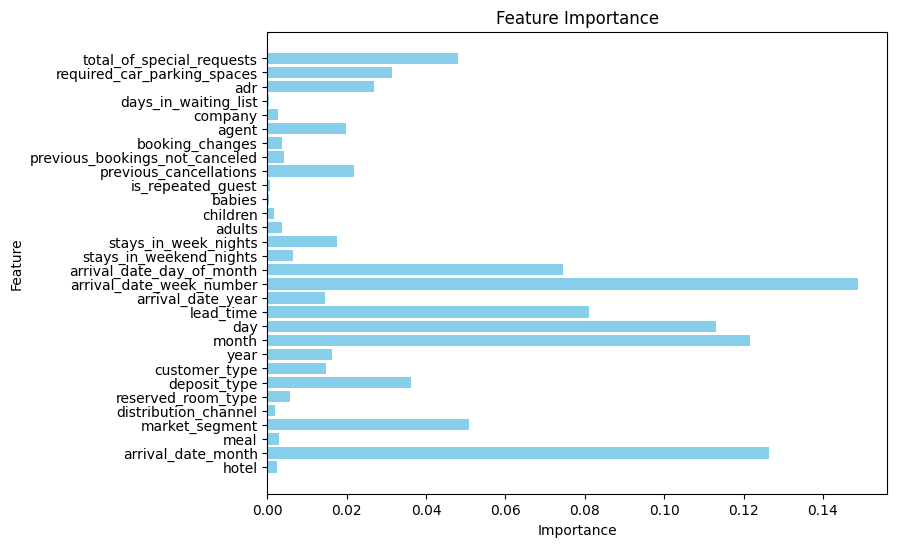

In [29]:
# 특성 중요도 출력
importance = model.feature_importances_
feature_names = X.columns



# 막대 그래프로 특성 중요도 시각화
plt.figure(figsize=(8, 6))
plt.barh(feature_names, importance, color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

In [30]:
# 트리 시각화 하기

from sklearn.tree import export_graphviz
import graphviz
export_graphviz(model, out_file="tree.dot", class_names=["not-canceled","canceled"],
               feature_names=X.columns, impurity=False, filled=True)

with open("tree.dot") as f:
    dot_graph = f.read()

display(graphviz.Source(dot_graph))